<a href="https://colab.research.google.com/github/EWECORP/DScience_41870/blob/main/Data_StoryTelling_2_Eduardo_Ettlin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

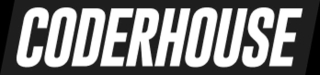

# **CURSO DE DATA SCIENCE**
##**DATA STORY TELLING**
## **DESAFIO N° 10 - DATA STORY TELLING**

*AUTOR:Eduardo ETTLIN

Accidentes en EE. UU. (2016 - 2021)
Un conjunto de datos de accidentes de tráfico en todo el país (2016 - 2021)


**Acerca del conjunto de datos**

*Descripción*

Este es un conjunto de datos de accidentes automovilísticos de todo el país, que cubre 49 estados de los EE. UU. Los datos de accidentes se recopilan desde febrero de 2016 hasta diciembre de 2021, utilizando múltiples API que proporcionan transmisión de datos de incidentes (o eventos) de tráfico. Estas API transmiten datos de tráfico capturados por una variedad de entidades, como los departamentos de transporte estatales y de EE. UU., agencias de aplicación de la ley, cámaras de tráfico y sensores de tráfico dentro de las redes de carreteras. Actualmente, hay alrededor de 2,8 millones de registros de accidentes en este conjunto de datos.
"Se entrega el siguiente set de datos con nombre “US_Accidents_Dec21_updated.csv”.

**Contenido**

Este conjunto de datos se ha recopilado en tiempo real mediante varias API de tráfico. Actualmente, contiene datos de accidentes recopilados desde febrero de 2016 hasta diciembre de 2021 para los Estados Unidos contiguos.

**Inspiración**

US-Accidentes” se puede utilizar para numerosas aplicaciones, como la predicción de accidentes automovilísticos en tiempo real, el estudio de ubicaciones de puntos críticos de accidentes automovilísticos, el análisis de víctimas y la extracción de reglas de causa y efecto para predecir accidentes automovilísticos, y el estudio del impacto de la precipitación u otros estímulos ambientales en la ocurrencia de accidentes. La publicación más reciente del conjunto de datos también puede ser útil para estudiar el impacto de COVID-19 en el comportamiento del tráfico y los accidentes.

**Cobertura**

El conjunto de datos cubre 49 estados de los EE. UU. El siguiente diagrama muestra la distribución actual de datos en todos los estados.

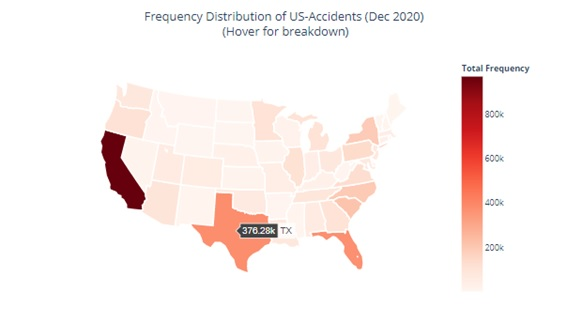

#**Introducción**

**Contexto empresarial.**

Estados Unidos ha experimentado un aumento en el número de accidentes en las carreteras. Quieren saber si el número de accidentes ha aumentado en las últimos meses. Para todos los accidentes reportados, han recopilado detalles para cada accidente y han estado manteniendo registros durante los últimos 5 años(desde 2016 hasta 2021).

El cliente nos ha contratado para que construyas visualizaciones que les ayuden a identificar patrones en accidentes, lo que les ayudaría a tomar acciones preventivas para reducir la cantidad de accidentes en el futuro. Tienen ciertos parámetros como geologalización, hora del día, condiciones climáticas, gravedad del accidente, etc. De los que se preocupan y de los que les gustaría obtener información específica.

**Problema comercial.**

Nuestra tarea es formatear los datos proporcionados y proporcionar visualizaciones que respondan las preguntas específicas que tiene el cliente, que se mencionan a continuación.

**Contexto analítico.**

 Se le proporciona un archivo CSV (almacenado en la carpeta datos ya creada) que contiene detalles sobre cada accidente, como fecha, hora, ubicación del accidente, gravedad del accidente,etc. El delimitador en el archivo CSV dado es el signo (;) en lugar del predeterminado (,). Realizará las siguientes tareas con los datos:

Extraiga datos adicionales compementarios

Leer, transformar y preparar datos para su visualización

Realizar análisis y construir visualizaciones de los datos para identificar patrones en el conjunto de datos.

El cliente tiene un conjunto específico de preguntas a las que le gustaría obtener respuestas. Deberá proporcionar visualizaciones para acompañar estos:

1- ¿Cómo ha fluctuado el número de accidentes durante el último año y medio? ¿Han aumentado con el tiempo?.

2- Para un día en particular, ¿durante qué horas es más probable que ocurran accidentes?.

3- ¿Hay más accidentes entre semana que durante los fines de semana?.

4- ¿Cuál es la proporción de recuento de accidentes por estado o cuidad?

5- ¿Qué distritos tienen un número desproporcionadamente grande de accidentes para su tamaño?

6- Para cada municipio, ¿durante qué horas es más probable que ocurran accidentes?

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q #quiet mode

     / 22.6 MB 18.7 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 27.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 20.7 MB/s eta 0:00:00


In [2]:
#Conectamos mi drive
from google.colab import drive
#Importamos OS
import os
#Montamos drive
drive.mount('/content/gdrive', force_remount=True)
# Establecer ruta de acceso en drive
import os
print(os.getcwd())


Mounted at /content/gdrive
/content


In [3]:
#Importamos las librerias

# Operaciones Basicas
import numpy as np
import pandas as pd
#import pandas_profilingn # `import pandas_profiling` is going to be deprecated by April 1st.
import ydata_profiling
# Visualizacion de Datos
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
from ydata_profiling.utils.cache import cache_file


In [6]:
# Me muevo a la carpeta
os.chdir("/content/gdrive/MyDrive/DScience_41870")
print(os.getcwd())

#Lectura del dataframe
datos=pd.read_csv('/content/gdrive/MyDrive/DScience_41870/US_Accidents_Dec21_updated.csv',sep=',',nrows=1500000 )  # nrows: 1500000  # Disminuir Tamaño a 1.5 MM
datos.head()


/content/gdrive/MyDrive/DScience_41870


,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


In [7]:
#Veamos el shape
datos.shape

(1500000, 47)

In [8]:
#Tipo de estructura del dataset
type(datos)

pandas.core.frame.DataFrame

# Borrado de columnas

Elimino algunas columnas para alivianar del dataset

In [9]:
# Trato de evitar el uso excesivo de memoria y borro algunas columnas
col_del = [ 'Number', 'Start_Lat', 'Start_Lng','End_Lat', 'End_Lng','Zipcode', 'Country', 'Timezone', 'Airport_Code'] # Columnas a borrar que no aportan

In [10]:
# Borrar variables
datos=datos.drop(labels=col_del, axis=1) # Borrando las columnas en col_del
datos.columns # Verificando las columnas que quedaron

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Distance(mi)',
       'Description', 'Street', 'Side', 'City', 'County', 'State',
       'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)',
       'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [11]:
#Totalidad de registros por columnas
datos.count()

ID                       1500000
Severity                 1500000
Start_Time               1500000
End_Time                 1500000
Distance(mi)             1500000
Description              1500000
Street                   1499998
Side                     1500000
City                     1499926
County                   1500000
State                    1500000
Weather_Timestamp        1477346
Temperature(F)           1469171
Wind_Chill(F)            1273818
Humidity(%)              1467779
Pressure(in)             1473525
Visibility(mi)           1468437
Wind_Direction           1466507
Wind_Speed(mph)          1431446
Precipitation(in)        1249808
Weather_Condition        1467815
Amenity                  1500000
Bump                     1500000
Crossing                 1500000
Give_Way                 1500000
Junction                 1500000
No_Exit                  1500000
Railway                  1500000
Roundabout               1500000
Station                  1500000
Stop      

In [12]:
#Tipo de dato de cada columna
datos.dtypes

ID                        object
Severity                   int64
Start_Time                object
End_Time                  object
Distance(mi)             float64
Description               object
Street                    object
Side                      object
City                      object
County                    object
State                     object
Weather_Timestamp         object
Temperature(F)           float64
Wind_Chill(F)            float64
Humidity(%)              float64
Pressure(in)             float64
Visibility(mi)           float64
Wind_Direction            object
Wind_Speed(mph)          float64
Precipitation(in)        float64
Weather_Condition         object
Amenity                     bool
Bump                        bool
Crossing                    bool
Give_Way                    bool
Junction                    bool
No_Exit                     bool
Railway                     bool
Roundabout                  bool
Station                     bool
Stop      

In [13]:
#Principales medidas estadisticas
datos.describe().T

,count,mean,std,min,25%,50%,75%,max
Severity,1500000.0,2.090461,0.382203,2.00,2.000,2.000,2.000,4.000
Distance(mi),1500000.0,0.811489,1.507520,0.00,0.106,0.327,0.909,151.525
Temperature(F),1469171.0,66.013193,17.230419,-23.00,55.000,68.000,79.000,196.000
Wind_Chill(F),1273818.0,64.721534,19.244666,-44.00,54.000,68.000,79.000,196.000
Humidity(%),1467779.0,63.577312,22.498111,1.00,48.000,65.000,82.000,100.000
Pressure(in),1473525.0,29.479382,1.015720,0.02,29.330,29.820,30.000,58.900
Visibility(mi),1468437.0,9.180252,2.510530,0.00,10.000,10.000,10.000,140.000
Wind_Speed(mph),1431446.0,7.392384,5.450785,0.00,3.500,7.000,10.000,1087.000
Precipitation(in),1249808.0,0.007451,0.092897,0.00,0.000,0.000,0.000,24.000


In [14]:
#Data Profiling
profile = ydata_profiling.ProfileReport(datos)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-16-b67a174f5cce>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(datos.corr(), annot = True, cmap = 'Wistia')


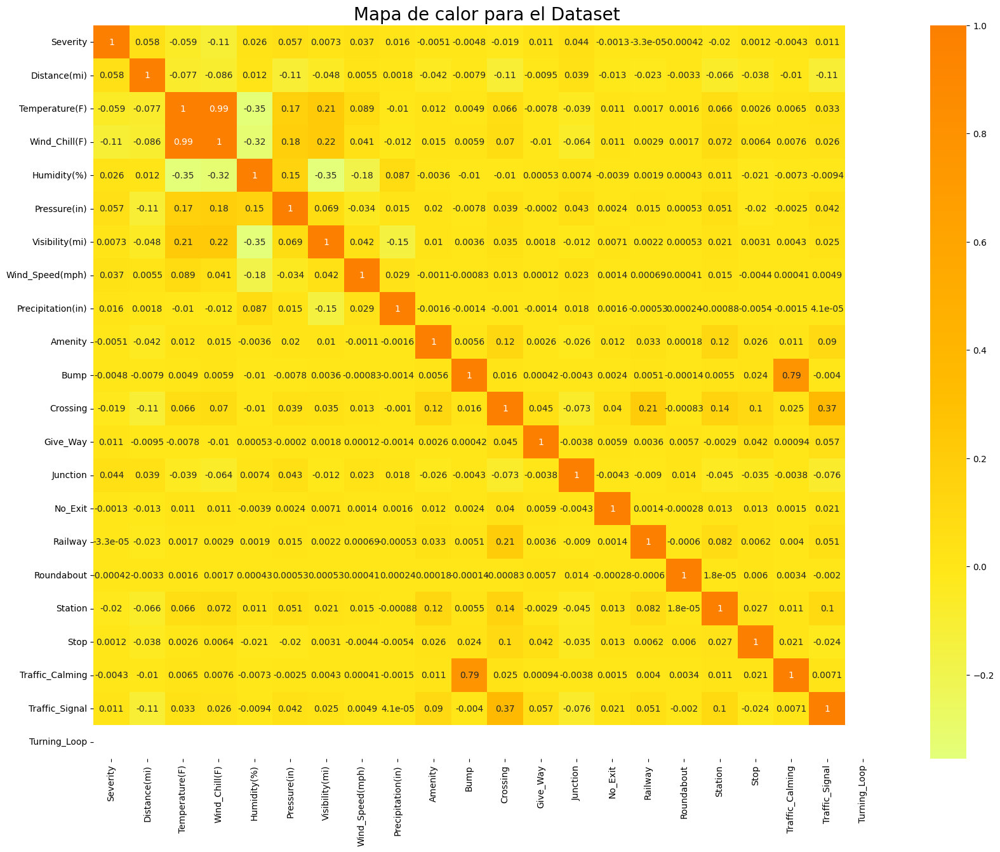

In [16]:
#Hagamos un HeatMap del df

plt.rcParams['figure.figsize'] = (20, 15)

sns.heatmap(datos.corr(), annot = True, cmap = 'Wistia')
plt.title('Mapa de calor para el Dataset', fontsize = 20)
plt.show()

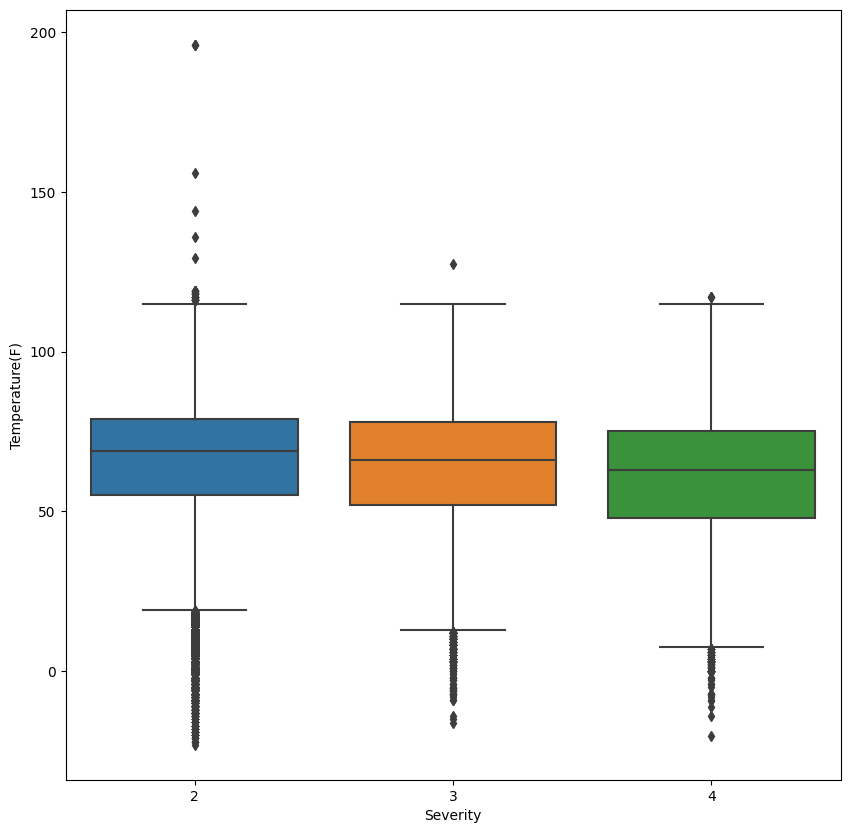

In [17]:
#Boxplot
plt.figure(figsize=(10,10)) #defino el tamaño del grafico
sns.boxplot(y = 'Temperature(F)', x = 'Severity', data = datos)
plt.show()

In [18]:
#Ejemplo: Categórica vs. categórica
pd.crosstab(datos.Severity,datos['Temperature(F)'])

Temperature(F),-23.0,-22.0,-21.0,-20.2,-20.0,-19.0,-18.0,-17.0,-16.1,-16.0,...,117.0,118.0,118.4,119.0,127.4,129.2,136.0,144.0,156.0,196.0
Severity,,,,,,,,,,,,,,,,,,,,,
2,1,3,5,0,14,17,12,22,0,17,...,11,3,3,5,0,1,1,1,1,3
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,3,0,0,0,0,0,0,0,0,0


In [19]:
pd.crosstab(datos.Severity, datos['Temperature(F)'], normalize=True) #Agregamos los valores en relativo

Temperature(F),-23.0,-22.0,-21.0,-20.2,-20.0,-19.0,-18.0,-17.0,-16.1,-16.0,...,117.0,118.0,118.4,119.0,127.4,129.2,136.0,144.0,156.0,196.0
Severity,,,,,,,,,,,,,,,,,,,,,
2,6.806560e-07,0.000002,0.000003,0.000000e+00,0.00001,0.000012,0.000008,0.000015,0.000000e+00,0.000012,...,0.000007,0.000002,0.000002,0.000003,0.000000e+00,6.806560e-07,6.806560e-07,6.806560e-07,6.806560e-07,0.000002
3,0.000000e+00,0.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,6.806560e-07,0.000000,...,0.000000,0.000000,0.000000,0.000000,6.806560e-07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
4,0.000000e+00,0.000000,0.000000,6.806560e-07,0.00000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000002,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000


In [20]:
datos.groupby('Severity')['Temperature(F)'].mean()

Severity
2    66.246751
3    64.094799
4    60.664213
Name: Temperature(F), dtype: float64

<Axes: xlabel='Severity', ylabel='Temperature(F)'>

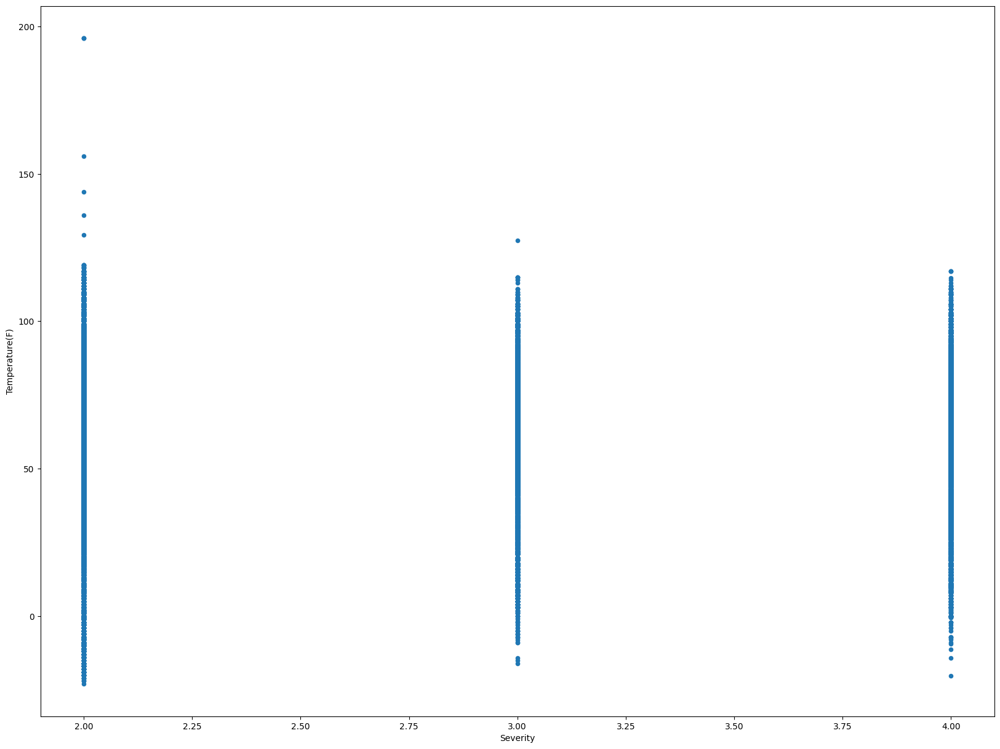

In [21]:
#Scatterplot
datos.plot.scatter(x='Severity', y='Temperature(F)')

<Axes: xlabel='Severity', ylabel='Temperature(F)'>

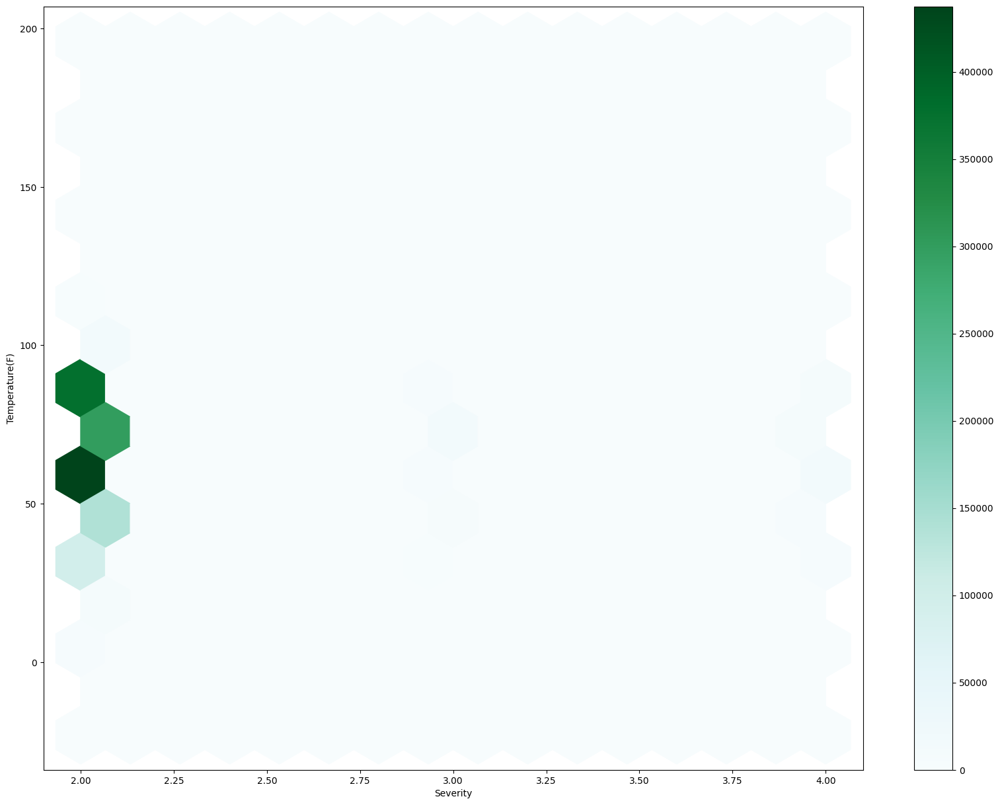

In [22]:
datos.plot.hexbin(x='Severity', y='Temperature(F)', gridsize=15)

Como conclusión rápida podemos observar que a medida que sube la temperatura(F) aumentan los accidentes con la gravedad del tipo 2.

# ANALISIS BIVARIADOS



In [24]:
pd.crosstab(datos.Severity, datos.Traffic_Calming, normalize=True) #Agregamos los valores en relativo

Traffic_Calming,False,True
Severity,,
2,0.940770,0.000670
3,0.026651,0.000009
4,0.031895,0.000005


### Analizo Otros cruces



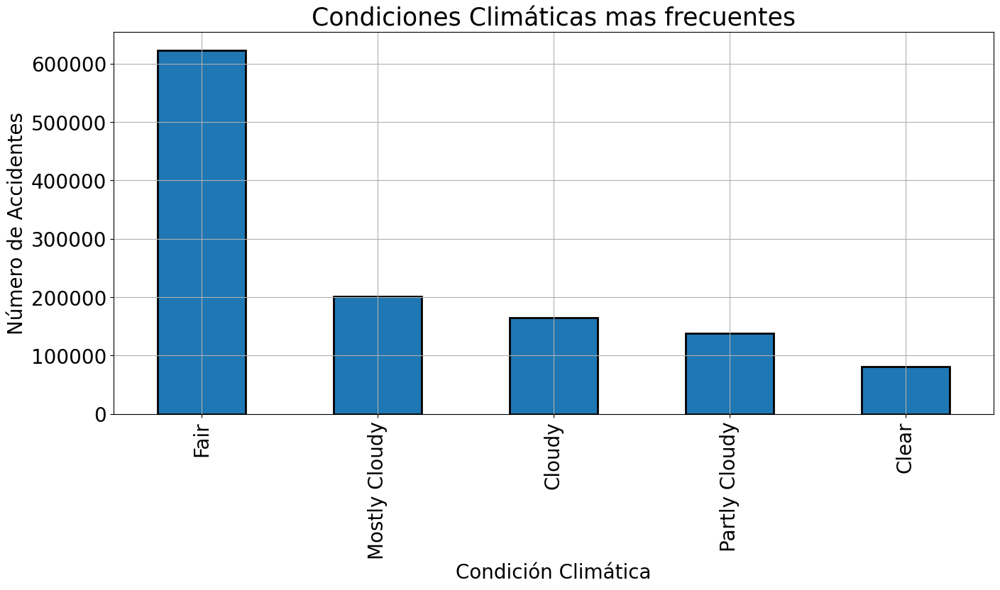

In [31]:
fig, ax=plt.subplots(figsize=(16,7))
datos['Weather_Condition'].value_counts().sort_values(ascending=False).head(5).plot.bar(width=0.5,edgecolor='k',align='center',linewidth=2)
plt.xlabel('Condición Climática',fontsize=20)
plt.ylabel('Número de Accidentes',fontsize=20)
ax.tick_params(labelsize=20)
plt.title('Condiciones Climáticas mas frecuentes',fontsize=25)
plt.grid()
plt.ioff()

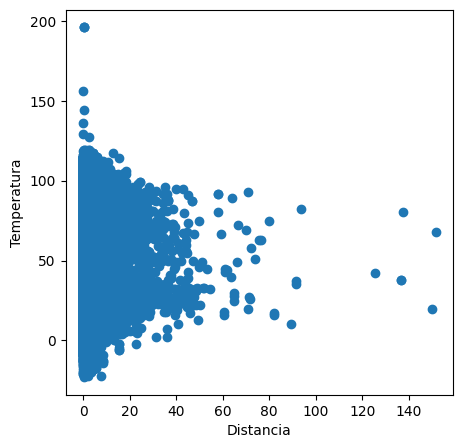

In [44]:
# Relación DISTANCIA --> Es mayor cuanto mas grave es el accidente y también se relaciona con la temperatura (hielo + accidentes)

fig, ax1 = plt.subplots(figsize=(5,5))
#ax1.title("Distancia vs. Temperatura", fontsize=15, verticalalignment='bottom');
ax1.set_xlabel("Distancia");
ax1.set_ylabel("Temperatura");
graf =  ax1.scatter(datos['Distance(mi)'], datos['Temperature(F)'])
plt.show()

# Recuento de Accidentes en AUTOPISTAS (Street)

Se puede observar que la mayoría de los accidente ocurren en las autopistas la sigla I-xxx significa ruta Interestatal y el sentido . Norte o Sur.

In [36]:
# crear un dataframe con Street y la cantidad de accidentes
street_df = pd.DataFrame( datos['Street'].value_counts()).reset_index().rename(columns={'index':'Street No.', 'Street':'Cases'})


In [37]:
top_ten_streets_df = pd.DataFrame(street_df.head(10))
top_ten_streets_df

,Street No.,Cases
0,I-95 N,21629
1,I-95 S,20037
2,I-5 N,15967
3,I-10 E,13065
4,I-10 W,12706
5,I-5 S,12470
6,I-80 W,8002
7,I-80 E,7271
8,I-405 N,6394
9,I-75 S,6201


In [40]:
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.patches as mpatches

<ipython-input-43-255370d4add7>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('gnuplot2', 10)


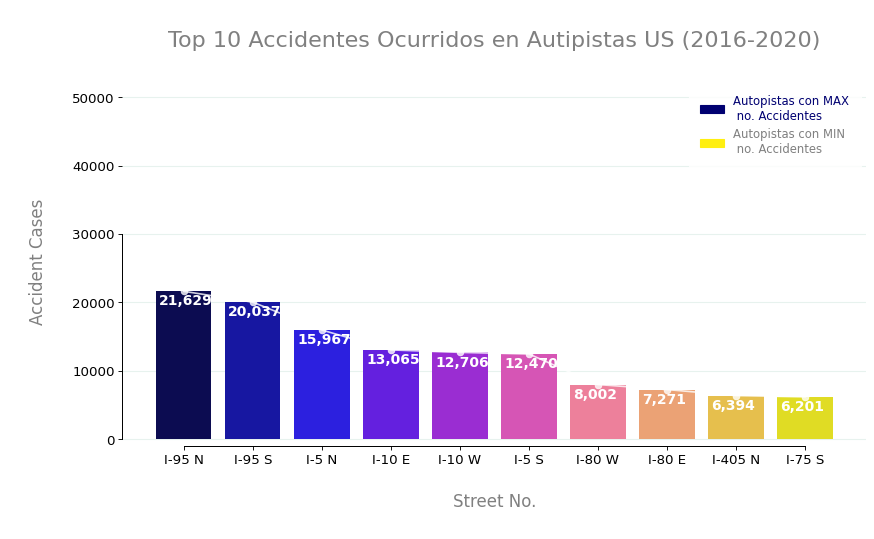

In [43]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)

cmap = cm.get_cmap('gnuplot2', 10)
clrs = [mpl.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax=sns.barplot(y=top_ten_streets_df['Cases'], x=top_ten_streets_df['Street No.'], palette='gnuplot2')
ax1 = ax.twinx()
sns.lineplot(data = top_ten_streets_df, marker='o', x='Street No.', y='Cases', color = 'white', alpha = .8)

total = datos.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.04, i.get_height()-2000, \
            '{:,d}'.format(int(i.get_height())), fontsize=12.5,weight='bold',
                color='white')

ax.axes.set_ylim(-1000, 53000)
ax1.axes.set_ylim(-1000, 53000)
plt.title('\nTop 10 Accidentes Ocurridos en Autipistas US (2016-2020)\n', size=20, color='grey')

ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nStreet No.\n', fontsize=15, color='grey')
ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')

for i in ['top','right']:
    side1 = ax.spines[i]
    side1.set_visible(False)
    side2 = ax1.spines[i]
    side2.set_visible(False)


ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)

ax.spines['bottom'].set_bounds(0.005, 9)
ax.spines['left'].set_bounds(0, 30000)
ax1.spines['bottom'].set_bounds(0.005, 9)
ax1.spines['left'].set_bounds(0, 30000)
ax.tick_params(axis='both', which='major', labelsize=12)

MA = mpatches.Patch(color=clrs[1], label='Autopistas con MAX\n no. Accidentes')
MI = mpatches.Patch(color=clrs[-2], label='Autopistas con MIN\n no. Accidentes')
ax.legend(handles=[MA, MI], prop={'size': 10.5}, loc='best', borderpad=1,
          labelcolor=[clrs[1], 'grey'], edgecolor='white');
plt.show()